# Modelo de PD | Ciência da Computação - 7º semestre

## Objetivo do Projeto

O objetivo do projeto é identificar pessoas que tenham chance de se tornar inadimplentes (não pagar a dívida) no mês seguinte.

## Quem usaria este modelo?

Esse modelo poderia ser utilizado, principalmente, por instituições financeiras. Bancões ou Fintechs, ambos poderiam se beneficiar com a solução que este modelo proporciona. Além de bancos, qualquer empresa que forneça algum tipo de crédito ou produto poderia utilizar este modelo, tendo a capacidade de prever uma possível inadimplência.

## Qual tipo de problema será resolvido?

Será um problema de classificação, ou seja, tem chance de ser inadimplente ou não (0, 1).

## Quais ganhos o projeto poderá trazer?

Os ganhos que o projeto oferece para o usuário estarão listados abaixo:

*   Avaliação mais precisa do risco de inadimplência dos clientes ou empresas;

*   Redução de perdas financeiras ao prever quais clientes tem maior probabilidade de não cumprir com suas obrigações;

*   Pode facilitar a precificação adequada do crédito, ajustando as taxas de juros de acordo com o risco do cliente;

*   Ajuda na segmentação de clientes, diferenciando os que possuem mais risco dos que são mais confiáveis.





# Importando bibliotecas

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split, GridSearchCV
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, RocCurveDisplay



pd.options.display.max_columns = None
pd.options.display.max_rows = 1000
pd.options.display.float_format = '{:.2f}'.format

# Leitura da base de dados

**Descrição das Variáveis da Base de Dados**

Este estudo utilizou uma variável binária, inadimplência no pagamento (Sim = 1, Não = 0), como variável resposta. A partir da revisão da literatura, foram selecionadas as seguintes 23 variáveis explicativas:

* **LIMIT_BAL**: Valor do crédito concedido (em dólares de Taiwan - NT$). Inclui tanto o crédito individual do consumidor quanto o crédito familiar (suplementar).
* **SEX**: Gênero (1 = Masculino; 2 = Feminino).
* **EDUCATION**: Escolaridade (1 = Pós-graduação; 2 = Universidade; 3 = Ensino Médio; 4 = Outros).
* **MARRIAGE**: Estado civil (1 = Casado; 2 = Solteiro; 3 = Outros).
* **AGE**: Idade (anos).

**Histórico de Pagamentos Passados (X6 - X11)**

Essas variáveis representam o status do pagamento mensal nos meses anteriores (de abril a setembro de 2005):

* **PAY_0**: Status do pagamento em setembro de 2005.
* **PAY_2**: Status do pagamento em agosto de 2005.
* **PAY_3**: Status do pagamento em julho de 2005.
* **PAY_4**: Status do pagamento em junho de 2005.
* **PAY_5**: Status do pagamento em maio de 2005.
* **PAY_6**: Status do pagamento em abril de 2005.

**Escala de medição para o status do pagamento:**

* -1 = Pagamento realizado no prazo.
* 1 = Atraso de 1 mês no pagamento.
* 2 = Atraso de 2 meses no pagamento.
…
* 8 = Atraso de 8 meses no pagamento.
* 9 = Atraso de 9 meses ou mais.

**Valor da Fatura (X12 - X17)**

Essas variáveis representam o valor da fatura mensal (em NT$) nos meses anteriores:

* **BILL_AMT1**: Valor da fatura em setembro de 2005.
* **BILL_AMT2**: Valor da fatura em agosto de 2005.
* **BILL_AMT3**: Valor da fatura em julho de 2005.
* **BILL_AMT4**: Valor da fatura em junho de 2005.
* **BILL_AMT5**: Valor da fatura em maio de 2005.
* **BILL_AMT6**: Valor da fatura em abril de 2005.

**Valor do Pagamento Anterior (X18 - X23)**

Essas variáveis indicam o valor pago (em NT$) nos meses anteriores:

* **PAY_AMT1**: Valor pago em setembro de 2005.
* **PAY_AMT2**: Valor pago em agosto de 2005.
* **PAY_AMT3**: Valor pago em julho de 2005.
* **PAY_AMT4**: Valor pago em junho de 2005.
* **PAY_AMT5**: Valor pago em maio de 2005.
* **PAY_AMT6**: Valor pago em abril de 2005.

In [10]:
df_original = pd.read_excel('default of credit card clients.xls', header=1)
df_original.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [11]:
print(f"Quantidade de linhas: {df_original.shape[0]}")
print(f"Quantidade de colunas: {df_original.shape[1]}")

Quantidade de linhas: 30000
Quantidade de colunas: 25


In [12]:
df_original.rename(columns={'default payment next month': 'DEFAULT'}, inplace=True)

# Criando novas variáveis

##### Criando variáveis a partir de agregações (soma, mínimo, máximo, média) para as colunas de valor da fatura e pagamento

In [15]:
def agregar_variaveis_temporais(df):
    resultado = df.copy()

    grupos = {
        'BILL_AMT': [f'BILL_AMT{i}' for i in range(1, 7)],
        'PAY_AMT': [f'PAY_AMT{i}' for i in range(1, 7)]
    }

    for grupo_nome, colunas in grupos.items():
        resultado[f'{grupo_nome}_sum'] = df[colunas].sum(axis=1)
        resultado[f'{grupo_nome}_mean'] = df[colunas].mean(axis=1)
        resultado[f'{grupo_nome}_min'] = df[colunas].min(axis=1)
        resultado[f'{grupo_nome}_max'] = df[colunas].max(axis=1)

    return resultado

In [16]:
df_agregado = agregar_variaveis_temporais(df_original)

##### SldDevedor: essa coluna diz quanto o cliente ainda precisa pagar para o banco

In [18]:
#df_agregado['SldDevedor'] = df_agregado['LIMIT_BAL'] - df_agregado['PAY_AMT_sum']

##### pLimitUtilizado: Essa coluna vê o percentual de gasto dos últimos 6 meses em relação ao limite total

In [20]:
df_agregado['pLimitUtilizado'] = df_agregado['BILL_AMT_sum']/ df_agregado['LIMIT_BAL']

In [21]:
#Dropando os valores que ficaram negativos na coluna SldDevedor por acreditar ser um erro da base
#df_agregado = df_agregado[df_agregado['SldDevedor'] >= 0]

##### meses_com_pagamento: essa coluna diz quantos meses o cliente realizou algum pagamento

In [23]:
pay_cols = [f'PAY_AMT{i}' for i in range(1, 7)]
df_agregado['meses_com_pagamento'] = (df_agregado[pay_cols] > 0).sum(axis=1)

In [24]:
#df_agregado['pagou_tudo'] = np.where(df_agregado['SldDevedor'] == 0, 1, 0)

In [25]:
bill_cols = [f'BILL_AMT{i}' for i in range(1, 7)]
for index, bill in enumerate(bill_cols):
    df_agregado[f'pDoLimiteGastoMes{index +1}'] = df_agregado[bill]/df_agregado['LIMIT_BAL']

In [26]:
df_agregado.head(10)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT,BILL_AMT_sum,BILL_AMT_mean,BILL_AMT_min,BILL_AMT_max,PAY_AMT_sum,PAY_AMT_mean,PAY_AMT_min,PAY_AMT_max,pLimitUtilizado,meses_com_pagamento,pDoLimiteGastoMes1,pDoLimiteGastoMes2,pDoLimiteGastoMes3,pDoLimiteGastoMes4,pDoLimiteGastoMes5,pDoLimiteGastoMes6
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,7704,1284.00,0,3913,689,114.83,0,689,0.39,1,0.20,0.16,0.03,0.00,0.00,0.00
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,17077,2846.17,1725,3455,5000,833.33,0,2000,0.14,4,0.02,0.01,0.02,0.03,0.03,0.03
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,101653,16942.17,13559,29239,11018,1836.33,1000,5000,1.13,6,0.32,0.16,0.15,0.16,0.17,0.17
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,231334,38555.67,28314,49291,8388,1398.00,1000,2019,4.63,6,0.94,0.96,0.99,0.57,0.58,0.59
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,109339,18223.17,5670,35835,59049,9841.50,679,36681,2.19,6,0.17,0.11,0.72,0.42,0.38,0.38
5,6,50000,1,1,2,37,0,0,0,0,0,0,64400,57069,57608,19394,19619,20024,2500,1815,657,1000,1000,800,0,238114,39685.67,19394,64400,7772,1295.33,657,2500,4.76,6,1.29,1.14,1.15,0.39,0.39,0.40
6,7,500000,1,1,2,29,0,0,0,0,0,0,367965,412023,445007,542653,483003,473944,55000,40000,38000,20239,13750,13770,0,2724595,454099.17,367965,542653,180759,30126.50,13750,55000,5.45,6,0.74,0.82,0.89,1.09,0.97,0.95
7,8,100000,2,2,2,23,0,-1,-1,0,0,-1,11876,380,601,221,-159,567,380,601,0,581,1687,1542,0,13486,2247.67,-159,11876,4791,798.50,0,1687,0.13,5,0.12,0.00,0.01,0.00,-0.00,0.01
8,9,140000,2,3,1,28,0,0,2,0,0,0,11285,14096,12108,12211,11793,3719,3329,0,432,1000,1000,1000,0,65212,10868.67,3719,14096,6761,1126.83,0,3329,0.47,5,0.08,0.10,0.09,0.09,0.08,0.03
9,10,20000,1,3,2,35,-2,-2,-2,-2,-1,-1,0,0,0,0,13007,13912,0,0,0,13007,1122,0,0,26919,4486.50,0,13912,14129,2354.83,0,13007,1.35,2,0.00,0.00,0.00,0.00,0.65,0.70


In [27]:
df_agregado.shape

(30000, 41)

# Exploratory Data Analysis (EDA)

### Describe

In [30]:
df_agregado.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'DEFAULT',
       'BILL_AMT_sum', 'BILL_AMT_mean', 'BILL_AMT_min', 'BILL_AMT_max',
       'PAY_AMT_sum', 'PAY_AMT_mean', 'PAY_AMT_min', 'PAY_AMT_max',
       'pLimitUtilizado', 'meses_com_pagamento', 'pDoLimiteGastoMes1',
       'pDoLimiteGastoMes2', 'pDoLimiteGastoMes3', 'pDoLimiteGastoMes4',
       'pDoLimiteGastoMes5', 'pDoLimiteGastoMes6'],
      dtype='object')

In [31]:
df_agregado.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,30000.00,15000.50,8660.40,1.00,7500.75,15000.50,22500.25,30000.00
LIMIT_BAL,30000.00,167484.32,129747.66,10000.00,50000.00,140000.00,240000.00,1000000.00
SEX,30000.00,1.60,0.49,1.00,1.00,2.00,2.00,2.00
EDUCATION,30000.00,1.85,0.79,0.00,1.00,2.00,2.00,6.00
MARRIAGE,30000.00,1.55,0.52,0.00,1.00,2.00,2.00,3.00
AGE,30000.00,35.49,9.22,21.00,28.00,34.00,41.00,79.00
PAY_0,30000.00,-0.02,1.12,-2.00,-1.00,0.00,0.00,8.00
PAY_2,30000.00,-0.13,1.20,-2.00,-1.00,0.00,0.00,8.00
PAY_3,30000.00,-0.17,1.20,-2.00,-1.00,0.00,0.00,8.00
PAY_4,30000.00,-0.22,1.17,-2.00,-1.00,0.00,0.00,8.00


### Plotando gráficos das variáveis

In [33]:
grupo_col1 = ['LIMIT_BAL', 'AGE']

import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=len(grupo_col1), cols=1, subplot_titles=grupo_col1)

for i, col in enumerate(grupo_col1):
    fig.add_trace(go.Histogram(x=df_agregado[col], name=col), row=i+1, col=1)

fig.update_layout(height=800, width=1000, title_text="Histograma das Variáveis 'LIMIT_BAL' e 'AGE'")
fig.show()


In [34]:
grupo_col2 = ['LIMIT_BAL', 'AGE']

import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=len(grupo_col2), cols=1, subplot_titles=grupo_col2)

for i, col in enumerate(grupo_col2):
    fig.add_trace(go.Box(x=df_agregado[col], name=col), row=i+1, col=1)

fig.update_layout(height=800, width=1000, title_text="Boxplot das Variáveis 'LIMIT_BAL' e 'AGE'")
fig.show()

In [35]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

grupo_col3 = ['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']

fig = make_subplots(rows=len(grupo_col3), cols=1, subplot_titles=grupo_col3)

for i, col in enumerate(grupo_col3):
    # Count occurrences of each value in the column
    value_counts = df_agregado[col].value_counts()

    fig.add_trace(go.Bar(x=value_counts.index.astype(int), y=value_counts.values, name=col),
                  row=i+1, col=1)
    fig.update_xaxes(tickvals=value_counts.index.astype(int), tickmode='array', row=i+1, col=1)

fig.update_layout(height=2300, width=1000, title_text="Gráfico de Barras das Variáveis 'SEX', 'EDUCATION', 'MARRIAGE' e PAY_0... PAY_6")
fig.show()


In [36]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

grupo_col4 = ['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']

fig = make_subplots(rows=len(grupo_col4), cols=1, subplot_titles=grupo_col4)

for i, col in enumerate(grupo_col4):
    fig.add_trace(go.Box(x=df_agregado[col], name=col), row=i+1, col=1)
    fig.update_xaxes(range=[0, 200000], row=i+1, col=1)

fig.update_layout(height=4000, width=1000, title_text="Boxplot das Variáveis de Valor da Fatura e Pagamento")
fig.show()


#### De acordo com os gráficos e describe das variáveis acima, as features que possuem maior variabilidade são as que representam os valores do crédito concedido, valor da fatura e valor pago mensal.

#### Além disso, as variáveis comentadas acima e a variável 'AGE' possuem outliers.

### Plotando a matriz de correlação

In [39]:
matriz_correlacao = df_agregado.corr()

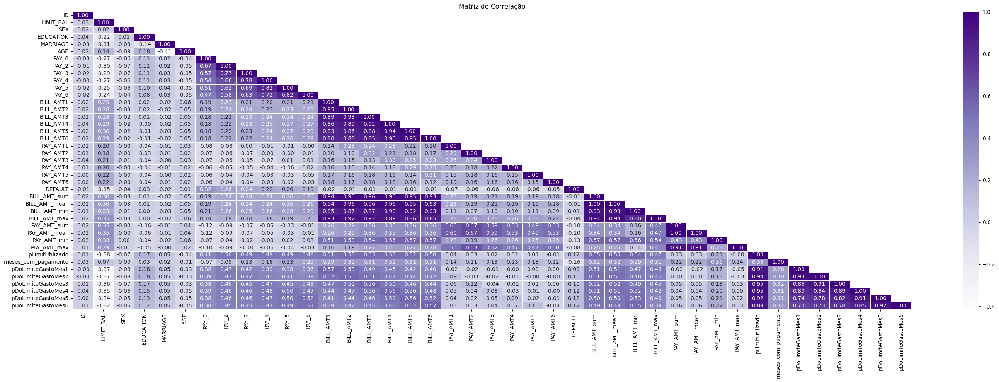

In [40]:
mask = np.triu(np.ones_like(matriz_correlacao, dtype=bool), k=1)

plt.figure(figsize=(35, 10))
sns.heatmap(matriz_correlacao, mask=mask, annot=True, fmt=".2f", cmap="Purples", linewidths=0.5)

plt.title("Matriz de Correlação")
plt.show()

#### Como é visto na Matriz de Correlação apresentada, não há nenhuma variável altamente correlacionada com a nossa variável target.

#### As 3 variáveis com **MAIOR** correlação são:

*   PAY_0
*   PAY_2
*   PAY_3

#### As 3 variáveis com **MENOR** correlação são:

*   AGE
*   BILL_AMT2
*   BILL_AMT2

#### A única variável que não possui correlação entre as selecionadas acima é a 'AGE', o restante possui alta correlação.






#### As variáveis categóricas foram tratadas com Label Encoding na origem. Por isso, não foi necessário realizar nenhum tratamento adicional.

# Split Treino e Teste

In [44]:
df = df_agregado.copy()

In [45]:
df.drop('ID', axis=1, inplace=True)

In [46]:
df.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,DEFAULT,BILL_AMT_sum,BILL_AMT_mean,BILL_AMT_min,BILL_AMT_max,PAY_AMT_sum,PAY_AMT_mean,PAY_AMT_min,PAY_AMT_max,pLimitUtilizado,meses_com_pagamento,pDoLimiteGastoMes1,pDoLimiteGastoMes2,pDoLimiteGastoMes3,pDoLimiteGastoMes4,pDoLimiteGastoMes5,pDoLimiteGastoMes6
0,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,7704,1284.00,0,3913,689,114.83,0,689,0.39,1,0.20,0.16,0.03,0.00,0.00,0.00
1,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,17077,2846.17,1725,3455,5000,833.33,0,2000,0.14,4,0.02,0.01,0.02,0.03,0.03,0.03
2,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,101653,16942.17,13559,29239,11018,1836.33,1000,5000,1.13,6,0.32,0.16,0.15,0.16,0.17,0.17
3,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,231334,38555.67,28314,49291,8388,1398.00,1000,2019,4.63,6,0.94,0.96,0.99,0.57,0.58,0.59
4,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,109339,18223.17,5670,35835,59049,9841.50,679,36681,2.19,6,0.17,0.11,0.72,0.42,0.38,0.38


In [47]:
X = df.drop('DEFAULT', axis=1)
y = df['DEFAULT']

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3,
                                                    random_state=94,
                                                    stratify=y)

# Normalização  e OHE (One Hot Encoding) das variáveis

##### Dummie

In [51]:
X_train.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,BILL_AMT_sum,BILL_AMT_mean,BILL_AMT_min,BILL_AMT_max,PAY_AMT_sum,PAY_AMT_mean,PAY_AMT_min,PAY_AMT_max,pLimitUtilizado,meses_com_pagamento,pDoLimiteGastoMes1,pDoLimiteGastoMes2,pDoLimiteGastoMes3,pDoLimiteGastoMes4,pDoLimiteGastoMes5,pDoLimiteGastoMes6
18572,60000,2,2,2,24,-1,0,-1,0,0,0,9970,7699,9479,10213,10000,11832,1020,9479,1000,200,1832,5889,59193,9865.50,7699,11832,19420,3236.67,200,9479,0.99,6,0.17,0.13,0.16,0.17,0.17,0.20
6985,50000,1,1,1,40,0,0,0,0,0,0,50657,50529,49162,19969,19893,20282,2015,2190,809,3012,5795,2001,210492,35082.00,19893,50657,15822,2637.00,809,5795,4.21,6,1.01,1.01,0.98,0.40,0.40,0.41
29076,50000,2,3,2,56,0,-1,-1,2,0,0,26242,2946,6152,4419,4419,1473,3006,6152,0,0,0,0,45651,7608.50,1473,26242,9158,1526.33,0,6152,0.91,2,0.52,0.06,0.12,0.09,0.09,0.03
7725,210000,1,2,1,41,1,2,0,0,0,0,149343,145319,86335,69670,59502,119494,0,5000,3600,2000,2000,5000,629663,104943.83,59502,149343,17600,2933.33,0,5000,3.00,5,0.71,0.69,0.41,0.33,0.28,0.57
12442,500000,1,3,2,51,-1,-1,-1,-1,-1,-1,2362,575,360,964,957,176,575,361,978,958,176,310,5394,899.00,176,2362,3358,559.67,176,978,0.01,6,0.00,0.00,0.00,0.00,0.00,0.00


In [52]:
cols_categorica = ['SEX', 'MARRIAGE']

X_train = pd.get_dummies(X_train, columns=cols_categorica, drop_first=True)

X_test = pd.get_dummies(X_test, columns=cols_categorica, drop_first=True)

In [53]:
for col in X_train.columns:
    if X_train[col].dtype == 'bool':
        X_train[col] = X_train[col].astype(int)

In [54]:
for col in X_test.columns:
    if X_test[col].dtype == 'bool':
        X_test[col] = X_test[col].astype(int)

##### StandardScaler

In [56]:
cols_dummie = ["SEX_2", "MARRIAGE_1", "MARRIAGE_2", "MARRIAGE_3"]

cols_numerica = [col for col in X_train.columns if col not in cols_dummie]

In [57]:
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

scaler = StandardScaler()
X_train_scaled[cols_numerica] = scaler.fit_transform(X_train[cols_numerica])

X_test_scaled[cols_numerica] = scaler.transform(X_test[cols_numerica])

# PCA - (Principal Component Analisys)

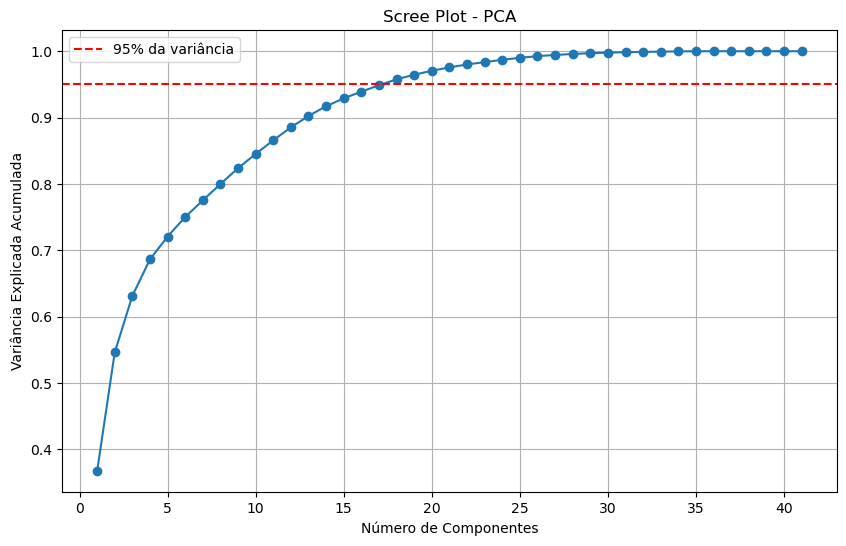

In [59]:
pca = PCA()
pca.fit(X_train_scaled)

explained_variance = pca.explained_variance_ratio_.cumsum()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.xlabel('Número de Componentes')
plt.ylabel('Variância Explicada Acumulada')
plt.title('Scree Plot - PCA')
plt.grid(True)
plt.axhline(y=0.95, color='r', linestyle='--', label='95% da variância')
plt.legend()
plt.show()

In [60]:

# 1. Defina quantos componentes quer manter (ou use variância acumulada)
pca = PCA(n_components=17)  # Por exemplo, manter 95% da variância

# 2. Ajusta e transforma o treino
X_train_pca = pca.fit_transform(X_train_scaled)

# 3. Aplica a mesma transformação no teste
X_test_pca = pca.transform(X_test_scaled)

# Regressão Logística

In [62]:
lr = LogisticRegression(random_state=92)

param_grid_lr = {
    "penalty": ["l1", "l2"], 
    "C": [0.01, 0.1, 1],                        
    "solver": ["liblinear"],
    "max_iter": [100, 500]                     
}


grid_search_lr = GridSearchCV(lr, param_grid_lr, cv=5, scoring="accuracy", n_jobs=-1)

grid_search_lr.fit(X_train, y_train) 

print("Melhores hiperparâmetros encontrados:", grid_search_lr.best_params_)
print("Melhor precisão obtida:", grid_search_lr.best_score_)

Melhores hiperparâmetros encontrados: {'C': 1, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Melhor precisão obtida: 0.8092857142857144


In [63]:
lr = LogisticRegression(random_state=92, C = 1, max_iter= 100, penalty = 'l1', solver = 'liblinear')
lr.fit(X_train_pca, y_train)
y_pred = lr.predict(X_test_pca)

In [64]:
# Previsões
y_pred = lr.predict(X_test_pca)
y_proba = lr.predict_proba(X_test_pca)[:, 1] 
# Métricas padrão
print("Acurácia:", accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# ROC e AUC
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

# Plot da curva ROC
#plt.figure(figsize=(8, 6))
#plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
#plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
#plt.xlabel('Taxa de Falsos Positivos (FPR)')
#plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
#plt.title('Curva ROC')
#plt.legend(loc='lower right')
#plt.grid()
#plt.show()

Acurácia: 0.8096666666666666
[[6767  242]
 [1471  520]]
              precision    recall  f1-score   support

           0       0.82      0.97      0.89      7009
           1       0.68      0.26      0.38      1991

    accuracy                           0.81      9000
   macro avg       0.75      0.61      0.63      9000
weighted avg       0.79      0.81      0.77      9000



In [65]:
# Obtendo as informações para montar a equação
coeficientes = lr.coef_[0] 
intercepto = lr.intercept_[0]

# equação
equacao = f"P(y=1|x) = 1 / (1 + exp(-({intercepto:.3f} "
for i, c in enumerate(coeficientes):
    equacao += f"+ {c:.3f} * X{i+1} "
equacao += ")))"

# Imprimindo a equação
print("Equação da Regressão Logística:")
print(equacao)


Equação da Regressão Logística:
P(y=1|x) = 1 / (1 + exp(-(-1.473 + 0.036 * X1 + -0.284 * X2 + 0.047 * X3 + -0.267 * X4 + 0.102 * X5 + 0.394 * X6 + 0.141 * X7 + 0.188 * X8 + -0.116 * X9 + 0.159 * X10 + 0.078 * X11 + -0.005 * X12 + -0.126 * X13 + -0.017 * X14 + -0.190 * X15 + -0.163 * X16 + -0.104 * X17 )))


# SGD
- Criando o SGD e tentando obter os melhores hiperparâmetros com GridSearch

In [67]:
sgd = SGDClassifier(random_state=92)
param_grid_sgd = {
    "loss": ["hinge", "log_loss"],        
    "penalty": ["l1", "l2", "elasticnet"],  
    "alpha": [0.0001, 0.001, 0.01],         
    "max_iter": [500, 1000, 2000],         
    "l1_ratio": [0.15, 0.5, 0.85],          
}

grid_search_sgd = GridSearchCV(sgd, param_grid_sgd, cv = 5, scoring = 'accuracy', n_jobs = -1)
grid_search_sgd.fit(X_train_pca, y_train)
print("Melhores hiperparâmetros encontrados:", grid_search_sgd.best_params_)
print("Melhor precisão obtida:", grid_search_sgd.best_score_)

Melhores hiperparâmetros encontrados: {'alpha': 0.01, 'l1_ratio': 0.15, 'loss': 'log_loss', 'max_iter': 500, 'penalty': 'l2'}
Melhor precisão obtida: 0.8089047619047619


In [68]:
# Treinando com os hiperparâmetros encontrados
sgd = SGDClassifier(random_state=92, alpha = 0.01, l1_ratio = 0.15, loss = 'log_loss', max_iter = 500, penalty = 'l2')
sgd.fit(X_train_pca, y_train)
y_pred = sgd.predict(X_test_pca)

In [69]:
# Previsões
y_pred = sgd.predict(X_test_pca)
y_scores = sgd.decision_function(X_test_pca)

# Métricas padrão
print("Acurácia:", accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# ROC e AUC
#fpr, tpr, thresholds = roc_curve(y_test, y_scores)
#roc_auc = auc(fpr, tpr)

# Plot da curva ROC
#plt.figure(figsize=(8, 6))
#plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
#plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
#plt.xlabel('Taxa de Falsos Positivos (FPR)')
#plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
#plt.title('Curva ROC')
#plt.legend(loc='lower right')
#plt.grid()
#plt.show()

Acurácia: 0.809
[[6781  228]
 [1491  500]]
              precision    recall  f1-score   support

           0       0.82      0.97      0.89      7009
           1       0.69      0.25      0.37      1991

    accuracy                           0.81      9000
   macro avg       0.75      0.61      0.63      9000
weighted avg       0.79      0.81      0.77      9000



In [70]:
# Obtendo o parâmetro de regularização/penalização
print('o Hiperparâmetro de penalização/regularização é o penalty = ', sgd.get_params()['penalty'])

o Hiperparâmetro de penalização/regularização é o penalty =  l2


# Árvore de Decisão

- Criando o modelo e tentando obter os melhores hiperparâmetros

In [72]:
dt = DecisionTreeClassifier(random_state=92)
param_grid_dt = {
    "criterion": ["gini", "entropy"],         
    "max_depth": [4, 5, 10, 20],           
    "min_samples_split": [2, 5, 10],          
    "min_samples_leaf": [1, 2, 4],            
    "max_features": [5, "sqrt", "log2"],   
}

grid_search_dt = GridSearchCV(dt, param_grid_dt, cv=5, scoring="accuracy", n_jobs=-1)

grid_search_dt.fit(X_train_pca, y_train)


print("Melhores hiperparâmetros encontrados:", grid_search_dt.best_params_)
print("Melhor precisão obtida:", grid_search_dt.best_score_)

Melhores hiperparâmetros encontrados: {'criterion': 'gini', 'max_depth': 4, 'max_features': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Melhor precisão obtida: 0.8013809523809524


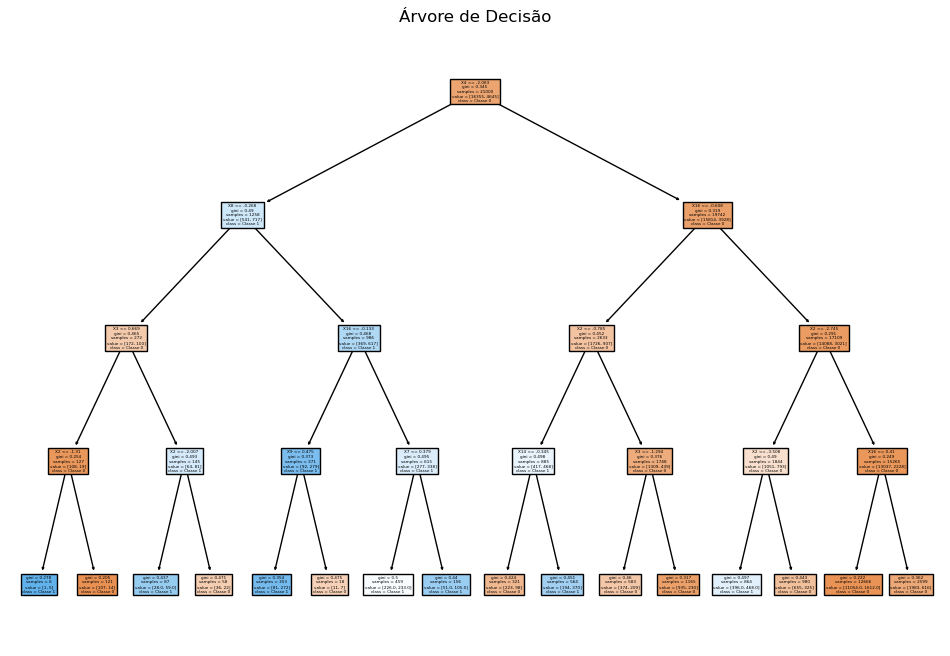

In [73]:
# Treinando com os melhores hiperparâmetros encontrados
dt = DecisionTreeClassifier(random_state=92, max_depth=4, max_features= 5, min_samples_leaf= 1, min_samples_split = 2, criterion = 'gini' )
dt.fit(X_train_pca, y_train)
y_pred = dt.predict(X_test_pca)


plt.figure(figsize=(12, 8))
plot_tree(dt, feature_names=["X" + f"{i}" for i in range(1, 18)], class_names=["Classe 0", "Classe 1"], filled=True)
plt.title("Árvore de Decisão")
plt.show()


In [74]:
# Previsões
y_pred = dt.predict(X_test_pca)
y_proba = dt.predict_proba(X_test_pca)[:, 1] 

# Métricas padrão
print("Acurácia:", accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# ROC e AUC
#fpr, tpr, thresholds = roc_curve(y_test, y_proba)
#roc_auc = auc(fpr, tpr)

# Plot da curva ROC
#plt.figure(figsize=(8, 6))
#plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
#plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
#plt.xlabel('Taxa de Falsos Positivos (FPR)')
#plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
#plt.title('Curva ROC')
#plt.legend(loc='lower right')
#plt.grid()
#plt.show()

Acurácia: 0.8012222222222222
[[6550  459]
 [1330  661]]
              precision    recall  f1-score   support

           0       0.83      0.93      0.88      7009
           1       0.59      0.33      0.42      1991

    accuracy                           0.80      9000
   macro avg       0.71      0.63      0.65      9000
weighted avg       0.78      0.80      0.78      9000



In [75]:
print('Os hiperparâmetros utilizados:')
dt.get_params()

Os hiperparâmetros utilizados:


{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 4,
 'max_features': 5,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': 92,
 'splitter': 'best'}

# Random Forest

In [77]:
rf = RandomForestClassifier(random_state=92)
param_grid = {
    "n_estimators": [50, 100, 200],         
    "max_depth": [4, 6, 15],            
    "min_samples_split": [2, 5],        
    "min_samples_leaf": [1, 2],          
    "max_features": [5, 6],       
    "bootstrap": [True, False]              
}

grid_search_rf = GridSearchCV(rf, param_grid, cv=5, scoring="accuracy", n_jobs = -1)
grid_search_rf.fit(X_train_pca, y_train)
print("Melhores hiperparâmetros encontrados:", grid_search_rf.best_params_)
print("Melhor precisão obtida:", grid_search_rf.best_score_)

Melhores hiperparâmetros encontrados: {'bootstrap': True, 'max_depth': 15, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Melhor precisão obtida: 0.8147619047619049


In [78]:
rf = RandomForestClassifier(random_state=92, bootstrap = True, max_depth=15, max_features=5, min_samples_leaf=2, min_samples_split = 5, n_estimators = 100)
rf.fit(X_train_pca, y_train)
y_pred = rf.predict(X_test_pca)

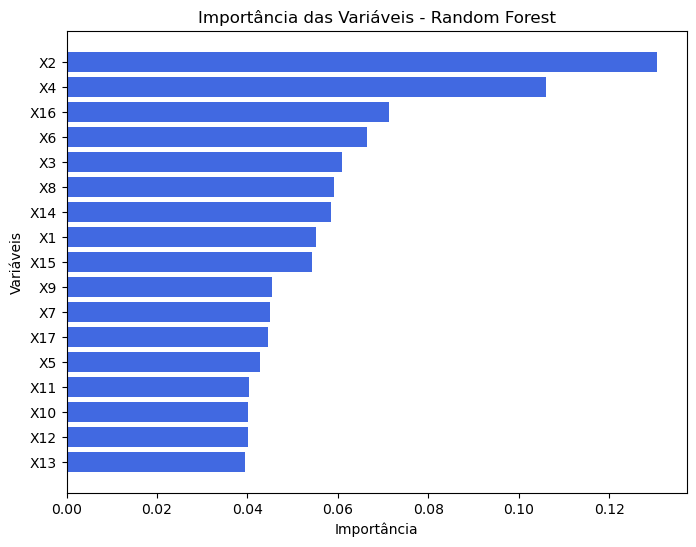

In [79]:
# Obtendo a importância das variáveis
importances = rf.feature_importances_


feature_names = ["X" + f"{i}" for i in range(1, 18)] 

sorted_indices = np.argsort(importances)[::-1]
sorted_importances = importances[sorted_indices]
sorted_features = [feature_names[i] for i in sorted_indices]


plt.figure(figsize=(8, 6))
plt.barh(sorted_features, sorted_importances, color="royalblue")
plt.xlabel("Importância")
plt.ylabel("Variáveis")
plt.title("Importância das Variáveis - Random Forest")
plt.gca().invert_yaxis()  
plt.show()


In [80]:
print('Hiperparâmetros utilizados')
rf.get_params()

Hiperparâmetros utilizados


{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 15,
 'max_features': 5,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 92,
 'verbose': 0,
 'warm_start': False}

In [81]:
y_pred = rf.predict(X_test_pca)
y_proba = rf.predict_proba(X_test_pca)[:, 1] 

# Métricas padrão
print("Acurácia:", accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# ROC e AUC
#fpr, tpr, thresholds = roc_curve(y_test, y_proba)
#roc_auc = auc(fpr, tpr)

# Plot da curva ROC
#plt.figure(figsize=(8, 6))
#plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
#plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
#plt.xlabel('Taxa de Falsos Positivos (FPR)')
#plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
#plt.title('Curva ROC')
#plt.legend(loc='lower right')
#plt.grid()
#plt.show()

Acurácia: 0.8145555555555556
[[6637  372]
 [1297  694]]
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      7009
           1       0.65      0.35      0.45      1991

    accuracy                           0.81      9000
   macro avg       0.74      0.65      0.67      9000
weighted avg       0.80      0.81      0.79      9000



## Tentando otimizar o Random Forest

In [83]:
def plot_roc_curve(modelos, X_test, y_test):
    plt.figure(figsize=(10, 6))
    
    for modelo in modelos:
        # Obtendo scores para a curva ROC
        if hasattr(modelo, "predict_proba"):
            y_scores = modelo.predict_proba(X_test)[:, 1] 
        else:
            y_scores = modelo.decision_function(X_test)
        
        # Calculando FPR, TPR e AUC
        fpr, tpr, _ = roc_curve(y_test, y_scores)
        roc_auc = auc(fpr, tpr)
        
        # Nome do modelo
        model_name = type(modelo).__name__
        
        # Plotando curva ROC
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
    
    # Configurações do gráfico
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Linha diagonal de referência
    plt.xlabel('Taxa de Falsos Positivos (FPR)')
    plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')
    plt.title('Curva ROC - Comparação de Modelos')
    plt.legend(loc="lower right")  # Exibindo legenda corretamente
    plt.show()

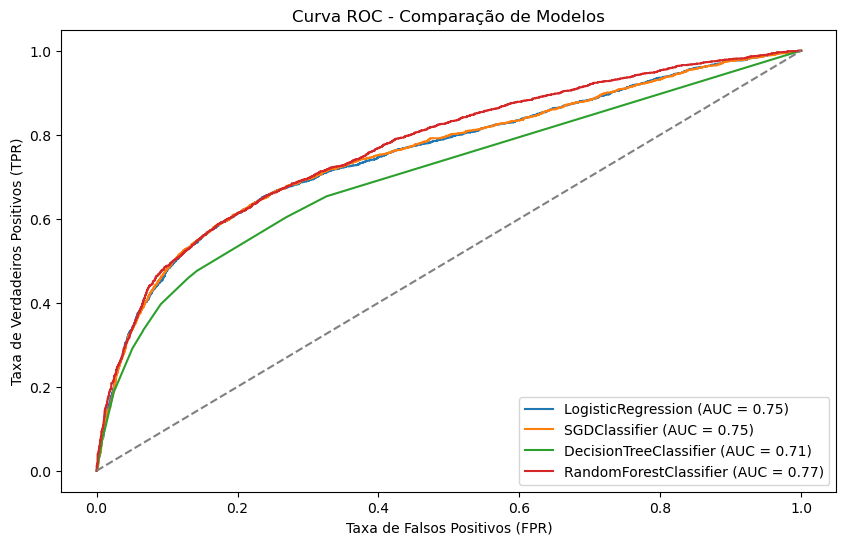

In [84]:
modelos = [lr, sgd, dt, rf]
plot_roc_curve(modelos, X_test_pca, y_test)

In [85]:
type(rf).__name__

'RandomForestClassifier'